In [0]:
pip install pinecone cohere

  Obtaining dependency information for pinecone from https://files.pythonhosted.org/packages/5b/c7/2bc1210aa51528b9ba75aede1f169998f50942cc47cdd82dd2dbcba4faa5/pinecone-6.0.2-py3-none-any.whl.metadata
  Obtaining dependency information for cohere from https://files.pythonhosted.org/packages/52/a7/52db5d464ca0956a31e510fe9327997759dff7ae16a16a05ab748261fd69/cohere-5.14.0-py3-none-any.whl.metadata
  Obtaining dependency information for pinecone-plugin-interface<0.0.8,>=0.0.7 from https://files.pythonhosted.org/packages/3b/1d/a21fdfcd6d022cb64cef5c2a29ee6691c6c103c4566b41646b080b7536a5/pinecone_plugin_interface-0.0.7-py3-none-any.whl.metadata
  Obtaining dependency information for fastavro<2.0.0,>=1.9.4 from https://files.pythonhosted.org/packages/c8/45/dba0cc08cf42500dd0f1e552e0fefe1cd81c47099d99277828a1081cbd87/fastavro-1.10.0-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata
  Obtaining dependency information for httpx-sse==0.4.0 from https://files.pythonhosted.org/pa

In [0]:
from sentence_transformers import SentenceTransformer
from datasets import load_dataset
from pinecone import Pinecone, ServerlessSpec
import os
import dotenv

from tqdm import tqdm
import cohere
import numpy as np
import warnings

from IPython.display import display
from pyspark.sql import DataFrame
from pyspark.sql.types import ArrayType, FloatType
import pyspark.sql.functions as F
from pyspark.sql.functions import col, concat_ws, collect_list, size

warnings.filterwarnings("ignore")

import spacy

load_dotenv()


2025-03-29 15:08:12.098765: I external/local_tsl/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-03-29 15:08:12.223856: I external/local_tsl/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-03-29 15:08:12.808895: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-03-29 15:08:14.756796: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


API keys:

In [0]:
# Replace with your own PineCone API KEY
PINECONE_API_KEY = os.environ.get("PINECONE_API_KEY", "") 

###Loading the course dataset

In [0]:
dataset_path = '/FileStore/tables/job_user_matching/Online_Courses.csv'

def upload_data(file_location):
    # File location and type
    file_type = "csv"

    # CSV options
    infer_schema = "false"
    first_row_is_header = "true"
    delimiter = ","
    quote_char = '"'

    # The applied options are for CSV files. For other file types, these will be ignored.
    df = spark.read.format(file_type) \
    .option("inferSchema", infer_schema) \
    .option("header", first_row_is_header) \
    .option("sep", delimiter) \
    .option("multiline", "true") \
    .option("quote", quote_char) \
    .option("maxCharsPerColumn", 1000000) \
    .option("escape", '"') \
    .load(file_location)

    return df

courses_df = upload_data(file_location=dataset_path)



In [0]:

# Step 1: Concatenate 
courses_concat_text = courses_df.withColumn(
    "course_desc", 
    concat_ws("; ", col("Title"),
                    col("Category"),
                    col("Sub-Category"),
                    col("Short Intro"),
                    col("Skills")))

courses_concat_text = courses_concat_text.select("Title",
                                                 "url",
                                                 "course_desc",
                                                 "Skills")

courses_concat_text.display()

Title,url,course_desc,Skills
Machine Learning Specialization,https://www.coursera.org/specializations/machine-learning-introduction,"Machine Learning Specialization; Data Science; Machine Learning; #BreakIntoAI with Machine Learning Specialization. Master fundamental AI concepts and develop practical machine learning skills in the beginner-friendly, 3-course program by AI visionary Andrew Ng; Decision Trees, Artificial Neural Network, Logistic Regression, Recommender Systems, Linear Regression, Regularization to Avoid Overfitting, Gradient Descent, Supervised Learning, Logistic Regression for Classification, Xgboost, Tensorflow, Tree Ensembles,","Decision Trees, Artificial Neural Network, Logistic Regression, Recommender Systems, Linear Regression, Regularization to Avoid Overfitting, Gradient Descent, Supervised Learning, Logistic Regression for Classification, Xgboost, Tensorflow, Tree Ensembles,"
Introduction to Data Science Specialization,https://www.coursera.org/specializations/introduction-data-science,"Introduction to Data Science Specialization; Data Science; Data Analysis; Launch your career in data science. Gain foundational data science skills to prepare for a career or further advanced learning in data science. ; Data Science, Relational Database Management System (RDBMS), Cloud Databases, Python Programming, SQL, Deep Learning, Machine Learning, Big Data, Data Mining, Github, Jupyter notebooks, Rstudio,","Data Science, Relational Database Management System (RDBMS), Cloud Databases, Python Programming, SQL, Deep Learning, Machine Learning, Big Data, Data Mining, Github, Jupyter notebooks, Rstudio,"
Data Science Fundamentals with Python and SQL Specialization,https://www.coursera.org/specializations/data-science-fundamentals-python-sql,"Data Science Fundamentals with Python and SQL Specialization; Data Science; Data Analysis; Build the Foundation for your Data Science career. Develop hands-on experience with Jupyter, Python, SQL. Perform Statistical Analysis on real data sets.; Data Science, Github, Python Programming, Jupyter notebooks, Rstudio, Data Analysis, Pandas, Numpy, Probability And Statistics, Regression Analysis, Data Visualization (DataViz), Statistical Hypothesis Testing,","Data Science, Github, Python Programming, Jupyter notebooks, Rstudio, Data Analysis, Pandas, Numpy, Probability And Statistics, Regression Analysis, Data Visualization (DataViz), Statistical Hypothesis Testing,"
Key Technologies for Business Specialization,https://www.coursera.org/specializations/key-technologies-for-business,"Key Technologies for Business Specialization; Business; Business Essentials; Get Ahead with Key Business Technologies. Gain Foundational Understanding of Key Technologies Driving Modern Businesses ; Data Science, Artificial Intelligence (AI), Business, Cloud Computing, technology, Cloud Native, Devops, Iaas PaaS Saas, Hybrid Multicloud, Deep Learning, Jobs, Machine Learning,","Data Science, Artificial Intelligence (AI), Business, Cloud Computing, technology, Cloud Native, Devops, Iaas PaaS Saas, Hybrid Multicloud, Deep Learning, Jobs, Machine Learning,"
Deep Learning Specialization,https://www.coursera.org/specializations/deep-learning,"Deep Learning Specialization; Data Science; Machine Learning; Become a Machine Learning expert. Master the fundamentals of deep learning and break into AI. Recently updated with cutting-edge techniques!; Artificial Neural Network, Convolutional Neural Network, Tensorflow, Recurrent Neural Network, Transformers, Deep Learning, Backpropagation, Python Programming, Neural Network Architecture, Mathematical Optimization, hyperparameter tuning, Inductive Transfer,","Artificial Neural Network, Convolutional Neural Network, Tensorflow, Recurrent Neural Network, Transformers, Deep Learning, Backpropagation, Python Programming, Neural Network Architecture, Mathematical Optimization, hyperparameter tuning, Inductive Transfer,"
IBM & Darden Digital Strategy Specialization,https://www.cours

#**Preprocessing & Embedding the data**

In [0]:
def load_and_embedd_dataset(
        dataset: DataFrame,
        model: SentenceTransformer = SentenceTransformer('all-MiniLM-L6-v2'),
        text_field: str = 'course_desc',
) -> tuple:
    """
    Load a dataset and embedd the text field using a sentence-transformer model
    Args:
        dataset_name: The name of the dataset to load
        split: The split of the dataset to load
        model: The model to use for embedding
        text_field: The field in the dataset that contains the text
        rec_num: The number of records to load and embedd
    Returns:
        tuple: A tuple containing the dataset and the embeddings
    """

    print("Loading and embedding the dataset")

    def embed_text(text):
        return model.encode(text).tolist() if text else None

    embed_udf = udf(embed_text, ArrayType(FloatType()))

    # Embed the first `rec_num` rows of the dataset
    result_df = dataset.withColumn("embedding", embed_udf(dataset[text_field]))

    print("Done!")
    return result_df

modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/10.5k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

In [0]:
from sentence_transformers import SentenceTransformer
EMBEDDING_MODEL = 'all-MiniLM-L6-v2'
model = SentenceTransformer(EMBEDDING_MODEL)

In [0]:
courses_df.count()

8092

##### remove duplicate courses

In [0]:
courses_concat_text = courses_concat_text.dropDuplicates(["url"])

In [0]:
courses_concat_text.count()

5273

In [0]:
dataset = load_and_embedd_dataset(
    dataset=courses_concat_text,
    model=model,
    text_field='course_desc'
)
dataset.display()

Loading and embedding the dataset
Done!


Title url course_desc Skills embedding Network Security https://www.coursera.org/learn/-network-security?specialization=certified-in-cybersecurity Network Security; Information Technology; Security; Welcome to course 4 of 5 of this Specialization, Network Security.; Cyberattacks,Network Security,Threat, Cyberattacks,Network Security,Threat, List(0.026858767, 0.0011211815, -0.01726042, -0.07201935, 0.014870586, 0.015474019, 0.059160057, 0.017792555, -0.067603245, 0.004845649, -0.022971911, -0.021097466, 0.060247682, 0.015080495, -0.020608688, -0.017935023, -0.0036367497, -0.05118482, -0.06817434, -0.026690643, 0.017426379, -0.03020193, 0.012670346, -0.09198622, -0.06432344, 0.028289633, 0.030798908, -0.064434275, -0.069519065, -0.056141265, -0.057967406, 0.044786796, -0.0072077652, 0.018808099, -0.08645726, -0.01743272, 0.050493184, 0.05959005, 0.08529948, 0.038417403, -0.0330596, -0.02096976, -0.033071358, -0.004178918, -0.021405809, -0.022552505, 0.00700333, -0.071255326, 0.0035506408, -0.065327466, 0.023516253, -0.019259594, -0.0767634, 0.06332015, 0.020853378, -0.12127481, 0.004297421, -0.02336522, 0.025818905, 0.03446305, 0.03491973, -0.048289623, -0.018034972, 0.04222313, 0.08185327, -0.009752533, -0.011317482, 0.039043847, -0.015664747, 0.044993952, -0.046145733, -0.06970232, -0.038510174, 0.06255547, 0.08139114, -0.03985985, 0.026346058, -0.027483065, 0.04365733, -0.07299046, 0.08462787, 0.05852288, -0.011398434, -0.0076276655, -0.038876176, 0.046593595, -0.08985832, -0.067602284, 0.039412484, -0.021024128, 0.0027326066, -0.04408021, -0.004000106, 0.041245908, 0.02095517, -0.0064116237, -0.070840485, -0.08865644, -0.026194999, 0.0019476973, -0.01913459, -0.0638462, -0.02906202, -0.0048487927, -0.0011157021, -0.0019106239, 0.037636403, 0.0023882708, 0.0339114, 0.009698584, -0.06254699, 0.011028529, -0.10662322, -0.06307492, 0.028348582, 0.048690625, -0.058123294, 0.07671256, 0.044818852, 0.03950297, 0.0063006496, 0.05580682, 0.019614637, -0.03671823, -0.030542672, -0.08434367, -0.124729805, -3.375574E-33, -0.07473541, 0.03573824, -0.057496056, 0.07753422, 0.05660843, -0.0159242, -0.0048493813, 0.02492581, -0.058029648, 0.016806075, -0.038539276, 0.034680102, 0.02440485, 0.004853554, 0.10287255, 0.042417534, 0.014132469, 0.044856977, 0.07681729, -0.019852404, 0.028401732, 0.054870095, 0.058185954, 0.038533363, 0.10233014, -0.043674268, -0.022049345, -0.035579752, 0.07437239, 0.01656792, -0.04479459, 0.0516169, -0.028685523, -0.05019071, 0.05884085, 0.06437547, -0.0060014846, -0.045386415, 0.010053024, -0.061029598, -0.08742986, -0.041459166, -0.062134612, 0.02558279, 0.07700671, -0.027271979, -0.028393183, 0.049431294, -0.008525249, -0.00269833, -0.047264684, -0.0061563607, 0.061664242, -0.0038808512, 0.0051897285, 0.022847319, 0.02123395, -0.017004346, -0.01052763, 0.069400646, -0.08452671, 0.019082801, -0.01983707, -0.09845695, 0.055259634, -0.017548814, 0.04276393, -0.0066654678, 0.05130591, 0.011209397, -0.045077488, 0.027174443, 0.020793162, 0.035960693, -0.028762247, 0.068150945, -0.05631253, 0.010416186, -0.012919342, 0.09107888, -0.13915846, 0.015407225, 0.050187316, 0.008998145, -0.042931113, 0.052729763, 0.040595148, -0.06063514, 4.975125E-4, 0.08626042, 0.01473737, -0.010480579, -0.0035331754, 0.098920554, 0.007013707, -3.2437367E-34, -0.034760565, 0.057267196, -0.11628319, 0.056929108, -0.00753226, 0.018488906, -0.0021073276, -0.034431167, -0.053632725, 0.09480797, -0.0085795, -0.03043164, -0.006148375, -0.054789703, 0.01749937, 5.150165E-4, -0.061389092, -0.015287526, -0.01643635, 0.009966379, 0.031367972, 0.06489904, -0.08127484, 0.025841143, 0.07673003, 0.060877923, -0.04748784, -0.04372049, 0.038415145, 0.07148956, -0.06315197, -0.0022640803, 0.03951478, 0.025852583, -0.025023283, 0.039451662, 0.093302935, -0.0382009, 0.0354799, -0.005897673, 0.084566645, 0.087438986, 0.06989904, 0.0322848, -0.016274462, -0.056319, -0.003350404, 0.12192904, -0.004369186, -0.048163183, 0.069137454, -0.022263378, -0.01008101

In [0]:
unique_count = dataset.select("url").distinct().count()
print(f"Number of unique values in 'column_name': {unique_count}")

Number of unique values in 'column_name': 5273


In [0]:
from pyspark.sql.functions import trim

dataset = dataset.filter(dataset["Skills"].isNotNull() & (trim(dataset["Skills"]) != ""))
dataset.count()

2099

In [0]:
shape = len(dataset.select(col("embedding")).limit(1).collect()[0][0])
shape

384

# **Inserting the data into Pinecone VectorDB**


### creating the index

In [0]:
def create_pinecone_index(
        index_name: str,
        dimension: int,
        metric: str = 'cosine',
):

    print("Creating a Pinecone index...")
    pc = Pinecone(api_key=PINECONE_API_KEY)
    existing_indexes = [index_info["name"] for index_info in pc.list_indexes()]
    if index_name not in existing_indexes:
        pc.create_index(
            name=index_name,
            dimension=dimension,

            metric=metric,
            spec=ServerlessSpec(
                cloud="aws",
                region="us-east-1"
            )
        )
    print("Done!")
    return pc

In [0]:
INDEX_NAME = 'course-index-prod'

# Create the vector database
# We are passing the index_name and the size of our embeddings
pc = create_pinecone_index(INDEX_NAME, shape)

Creating a Pinecone index...
Done!


inserting data into the index

In [0]:
def upsert_vectors(
        index: Pinecone,
        dataset: DataFrame,
        batch_size: int = 128
):
    """
    Upsert vectors to a pinecone index
    Args:
        index: The pinecone index object
        embeddings: The embeddings to upsert
        dataset: The dataset containing the metadata
        batch_size: The batch size to use for upserting
    Returns:
        An updated pinecone index
    """
    print("Upserting the embeddings to the Pinecone index...")
    
    # Get all column names except 'embedding' for metadata
    metadata_fields = [col for col in dataset.columns if col != "embedding"]

    collected_data = dataset.collect()

    # Generate unique IDs for each row
    ids = [str(i) for i in range(len(collected_data))]
a
    embeddings = [row["embedding"] for row in collected_data]  
    meta = [{col: row[col] for col in metadata_fields} for row in collected_data]  # Extract full metadata

    # Create list of (id, vector, metadata) tuples for upserting
    to_upsert = list(zip(ids, embeddings, meta))

    # Upsert in batches
    for i in tqdm(range(0, len(to_upsert), batch_size)):
        i_end = min(i + batch_size, len(to_upsert))
        index.upsert(vectors=to_upsert[i:i_end])

    print("Upserting complete!")
    return index


In [0]:
dataset = dataset.fillna({'Skills': ''})

In [0]:
# Upsert the embeddings to the Pinecone index
index = pc.Index(INDEX_NAME)
index_upserted = upsert_vectors(index, dataset)

Upserting the embeddings to the Pinecone index...


100%|██████████| 42/42 [00:14<00:00,  2.93it/s]

Upserting complete!


only courses with skills list - for evaluation purposes:

In [0]:
index.describe_index_stats()

{'dimension': 384,
 'index_fullness': 0.0,
 'metric': 'cosine',
 'namespaces': {'': {'vector_count': 5273}},
 'total_vector_count': 5273,
 'vector_type': 'dense'}

In [0]:
from functools import reduce
from pyspark.sql.functions import col, lower, split



def preprocess_data(job_skills_df, job_description_df_list):

    combined_df = reduce(lambda df1, df2: df1.union(df2), job_description_df_list)

    df_joined = combined_df.join(job_skills_df, on="job_link", how="left")
    df_joined = df_joined.withColumn("job_skills", lower(col("job_skills"))).withColumn("job_summary", lower(col("job_summary")))
    

    return df_joined

job_skill_file_location = "/FileStore/tables/job_skills.csv"
job_summary_file_locations = [f"/FileStore/tables/job_description(bbr)/job_summary_part{i}.csv" for i in range(1, 4)]
job_skill_df = upload_data(job_skill_file_location)
job_summary_list = [upload_data(file_location) for file_location in job_summary_file_locations]
final_df = preprocess_data(job_skill_df, job_summary_list)

final_df = final_df.withColumn("skills_list", split(col("job_skills"), ", "))


###loading the model

In [0]:
def generate_skills(text):
    ner_10000_word2vec = spacy.load("/Workspace/Users/ran.sela@campus.technion.ac.il/ner_model_10000_word2vec")
    ner_10000_word2vec_finetune_glassdoor = spacy.load("/Workspace/Users/ran.sela@campus.technion.ac.il/ner_10000_word2vec_glassdoor")
    ner_20000 = spacy.load("/Workspace/Users/ran.sela@campus.technion.ac.il/ner_model_20000")

    doc_10000_word2vec = ner_10000_word2vec(text)
    doc_10000_word2vec_finetune_glassdoor = ner_10000_word2vec_finetune_glassdoor(text)
    doc_20000_word2vec = ner_20000(text)

    skills_10000_word2vec  = [ent.text for ent in doc_10000_word2vec.ents if ent.label_ == "SKILL"]
    skills_10000_word2vec_finetune_glassdoor  = [ent.text for ent in doc_10000_word2vec_finetune_glassdoor.ents if ent.label_ == "SKILL"]
    skills_20000_word2vec  = [ent.text for ent in doc_20000_word2vec.ents if ent.label_ == "SKILL"]

    return set(skills_10000_word2vec + skills_10000_word2vec_finetune_glassdoor + skills_20000_word2vec)


### score calculation - soft Jaccard

In [0]:
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np

def get_avg_vector(skill, embedding_model):
    """
    Get the average vector for a multi-word skill from word embeddings.
    """
    words = skill.lower().split()
    vectors = [embedding_model[word] for word in words if word in embedding_model]
    return np.mean(vectors, axis=0) if vectors else None

def semantic_matching_score(job_skills, user_skills, embedding_model, threshold=0.5, verbose=False):
    """
    Computes soft semantic match score between user and job skills using word embeddings.
    
    Args:
        job_skills (set): Set of skills required for the job.
        user_skills (set): Set of skills the user currently has.
        embedding_model: Word2Vec-like embedding model.
        threshold (float): Cosine similarity threshold to consider a match.
        verbose (bool): Whether to print skill matches and gaps.

    Returns:
        float: Semantic match score between 0 and 100.
    """
    matched = 0

    for job_skill in job_skills:
        if len(job_skill.split()) > 1:
            job_vec = get_avg_vector(job_skill, embedding_model)
        elif job_skill in embedding_model:
            job_vec = embedding_model[job_skill]
        else:
            continue

        if job_vec is None:
            continue

        found_match = False
        for user_skill in user_skills:
            if len(user_skill.split()) > 1:
                user_vec = get_avg_vector(user_skill, embedding_model)
            elif user_skill in embedding_model:
                user_vec = embedding_model[user_skill]
            else:
                continue

            if user_vec is None:
                continue

            sim = cosine_similarity([job_vec], [user_vec])[0][0]
            if sim >= threshold:
                found_match = True
                break

        if found_match:
            matched += 1

    match_ratio = matched / len(job_skills) if job_skills else 0
    score = round(match_ratio * 100, 2)

    if verbose:
        print(f" Matched: {matched} / {len(job_skills)} | Score: {score}")
    
    return score

### creating propmt

In [0]:
def augment_prompt(
        job_description: str,
        user_data: str,
        model: SentenceTransformer = SentenceTransformer('all-MiniLM-L6-v2'),
        index=None,
        ground_truth_skills=None,
) -> str:

    results = [float(val) for val in list(model.encode(job_description))]

    # get top 50 results from knowledge base
    query_results = index.query(
        vector=results,
        top_k=50,
        include_values=True,
        include_metadata=True
    )['matches']
    text_matches = [match['metadata']['course_desc'] for match in query_results]


    # get the text from the results
    courses = "\n\n".join(text_matches)

    if ground_truth_skills is not None:
        job_skills = set(ground_truth_skills)
    else:
        job_skills = generate_skills(job_description)
    user_skills = generate_skills(user_data)
    skill_gap = job_skills.difference(user_skills)

    # feed into an augmented prompt
    improved_prompt = f"""Based on the list of courses provided below, recommend the 5 most relevant courses that best address the skill gaps between the candidate’s current abilities and the skills required for the job listing. Prioritize courses that are both highly relevant to the missing skills and well-aligned with the job requirements.
    Courses:
    {courses}
    Skill gap:
    {skill_gap}
    Job listing: {job_description}"""

    return improved_prompt, text_matches, job_skills, user_skills

In [0]:
def generate_augmented_answer(query,user, ground_truth_skills = None):
  augmented_prompt, source_knowledge, job_skills, user_skills = augment_prompt(query, user, model=model, index=index, ground_truth_skills=ground_truth_skills)
  co = cohere.Client(api_key=COHERE_API_KEY)
  response = co.chat(
        model='command-r-plus',
        message=augmented_prompt,
    )
  return response.text, source_knowledge, job_skills, user_skills

In [0]:
%pip install gensim

from gensim import downloader as api

WORD2VEC_PATH = 'word2vec.bin'
word2vec_model = api.load("word2vec-google-news-300")

  Obtaining dependency information for gensim from https://files.pythonhosted.org/packages/78/4f/f6045d5d5f8e7838c42572607ce440f95dbf4de5da41ae664198c2839c05/gensim-4.3.3-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0.0/26.7 MB ? eta -:--:--
   ━╸━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/26.7 MB 38.9 MB/s eta 0:00:01
   ━━━━━━━━━━╸━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.1/26.7 MB 103.7 MB/s eta 0:00:01
   ━━━━━━━━━━━━━━━━━━━╸━━━━━━━━━━━━━━━━━━━━ 13.1/26.7 MB 172.8 MB/s eta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━╸━━━━━━━━━━━━ 18.5/26.7 MB 162.5 MB/s eta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╺━━ 24.7/26.7 MB 174.6 MB/s eta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 26.7/26.7 MB 176.2 MB/s eta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 26.7/26.7 MB 176.2 MB/s eta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 26.7/26.7 MB 176.2 MB/s eta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 26.7/26.7 

####loading validation sets:


In [0]:
def upload_data(file_location):
    # File location and type
    file_type = "csv"

    # CSV options
    infer_schema = "false"
    first_row_is_header = "true"
    delimiter = ","
    quote_char = '"'

    # The applied options are for CSV files. For other file types, these will be ignored.
    df = spark.read.format(file_type) \
    .option("inferSchema", infer_schema) \
    .option("header", first_row_is_header) \
    .option("sep", delimiter) \
    .option("multiline", "true") \
    .option("quote", quote_char) \
    .option("maxCharsPerColumn", 1000000) \
    .option("escape", '"') \
    .load(file_location)

    return df

def preprocess_data(job_skills_df, job_description_df_list):

    combined_df = reduce(lambda df1, df2: df1.union(df2), job_description_df_list)

    df_joined = combined_df.join(job_skills_df, on="job_link", how="left")
    df_joined = df_joined.withColumn("job_skills", lower(col("job_skills"))).withColumn("job_summary", lower(col("job_summary")))


    return df_joined

In [0]:
job_skill_file_location = "/FileStore/tables/job_skills.csv"
job_summary_file_locations = [f"/FileStore/tables/job_description(bbr)/job_summary_part{i}.csv" for i in range(1, 4)]
job_skill_df = upload_data(job_skill_file_location)
job_summary_list = [upload_data(file_location) for file_location in job_summary_file_locations]

final_df = preprocess_data(job_skill_df, job_summary_list)
final_df = final_df.withColumn("skills_list", split(col("job_skills"), ", "))
final_df = final_df.filter((col("skills_list").isNotNull()) | (size(col("skills_list")) > 0))

sample1000_list = final_df.rdd.takeSample(False, 1000, seed=42)
sample1000_df = spark.createDataFrame(sample1000_list, schema=final_df.schema)

final_sub_1000_df = final_df.subtract(sample1000_df)
sample10000_list = final_sub_1000_df.rdd.takeSample(False, 10000, seed=42)
sample10000_df = spark.createDataFrame(sample10000_list, schema=final_df.schema)

final_sub_1000_10000_df = final_sub_1000_df.subtract(sample10000_df)
sample20000_list = final_sub_1000_10000_df.rdd.takeSample(False, 20000, seed=42)
sample20000_df = spark.createDataFrame(sample20000_list, schema=final_df.schema)

print(f"final DF Count: {final_df.count()}")
remaining_df = final_df.subtract(sample1000_df)
print(f"Remaining DF Count after subtraction 1000: {remaining_df.count()}")
remaining_df = remaining_df.subtract(sample10000_df)
print(f"Remaining DF Count after subtraction 10000: {remaining_df.count()}")
remaining_df = remaining_df.subtract(sample20000_df)
print(f"Remaining DF Count after subtraction 20000: {remaining_df.count()}")

# create validation set from remaining df 
validate_list = remaining_df.rdd.takeSample(False, 2000, seed=42)
validate_df = spark.createDataFrame(validate_list, schema=final_df.schema)

remaining_df_after_val = remaining_df.subtract(validate_df)
print(f"Remaining DF Count after validation: {remaining_df_after_val.count()}")

# create test set from remaining df (after validation subtraction)
test_list = remaining_df_after_val.rdd.takeSample(False, 2000, seed=42)
test_df = spark.createDataFrame(test_list, schema=final_df.schema)

final DF Count: 1294374
Remaining DF Count after subtraction 1000: 1293374
Remaining DF Count after subtraction 10000: 1283374
Remaining DF Count after subtraction 20000: 1263374
Remaining DF Count after validation: 1261374


In [0]:
job_val = validate_df

#### Loading Users data for evaluation

In [0]:
profiles = spark.read.parquet('/dbfs/linkedin_people_train_data')

profile_experience_explode = profiles.withColumn(
    "experience_explode", F.explode("experience")
).filter(
    (F.col("experience_explode.description").isNotNull()) |
    (F.col("experience_explode.positions").isNotNull())
)

profile_experience_positions_explode = profile_experience_explode.withColumn("positions_explode", F.explode("experience_explode.positions"))


profile_experience_positions_explode = profile_experience_positions_explode.withColumn("Company_Name",F.col("experience_explode.company"))\
                                                                           .withColumn("Position_Description", F.col("positions_explode.description"))\
                                                                           .withColumn("Position_Title", F.col("positions_explode.title"))

profile_experience_positions_explode = profile_experience_positions_explode.select("id",
                                                                                   "experience",
                                                                                   "experience_explode",
                                                                                   "Position_Description",
                                                                                   "Position_Title")



profile_experience_positions_null = profile_experience_explode.filter(
    (F.col("experience_explode.description").isNotNull()))

"""profile_experience_positions_null.withColumn("Company_Name",F.col("experience_explode.company"))\
                                 .withColumn("Position_Description", F.col("experience_explode.description"))\
                                 .withColumn("Position_Title", F.col("experience_explode.title"))"""


profile_experience_positions_null = profile_experience_positions_null.withColumn(
    "Company_Name", F.col("experience_explode.company"))\
        .withColumn("Position_Description", F.col("experience_explode.description"))\
            .withColumn("Position_Title", F.col("experience_explode.title"))

profile_experience_positions_null = profile_experience_positions_null.select(
    "id",
    "experience",
    "experience_explode",
    "Position_Description",
    "Position_Title"
)

merged_df = profile_experience_positions_explode.unionByName(profile_experience_positions_null)
# Step 1: Concatenate Position_Title and Position_Description
merged_concat_position = merged_df.withColumn(
    "position_concat", 
    concat_ws(": ", col("Position_Title"), col("Position_Description"))
)

merged_concat_position = merged_concat_position.select("id",
                                                       "experience",
                                                       "experience_explode",
                                                       "Position_concat")



# Step 2: Group by id and aggregate the new column with a delimiter (e.g., "\n")
concat_position_for_id = merged_concat_position.groupBy("id").agg(
    concat_ws("\n", collect_list("position_concat")).alias("aggregated_positions")
)

### sample random users and jobs

In [0]:
from pyspark.sql.functions import rand

user_val = concat_position_for_id.orderBy(rand(seed=42)).limit(2000)
job_val = validate_df.orderBy(rand(seed=41))

In [0]:
from pyspark.sql import Row

# Add index to df1
user_val = user_val.rdd.zipWithIndex().map(
    lambda x: Row(index=x[1], **x[0].asDict())
).toDF()

# Add index to df2
job_val = job_val.rdd.zipWithIndex().map(
    lambda x: Row(index=x[1], **x[0].asDict())
).toDF()

joined_df = user_val.join(job_val, on="index").drop("index")

In [0]:
joined_val_df = joined_df

converting to pandas as calling the Cohere api via spark udf causes error

In [0]:
joined_val_df_pd = joined_val_df.select("job_summary", "aggregated_positions", "skills_list").collect()


### Evaluating:

In [0]:
def get_skills_for_courses(courses_names, dataset):
    """
    Return a dictionary of {course_title: skills} for exact (or contains) matches.
    """
    course_skills_map = {}

    for course in courses_names:
        # Try to find the course in dataset (contains is more lenient than exact match)
        result = dataset.filter(F.col("Title").contains(course)).select("Skills").collect()
        
        if result:
            # You can choose result[0][0] or join all if multiple matches
            course_skills_map[course] = result[0][0].split(", ")
        else:
            course_skills_map[course] = []  # If not found

    return course_skills_map

In [0]:
import re

def calculate_new_semantic_score(answer, user_skills, job_skills):
    courses_names = re.findall(r'\d+\.\s+(.*?):', answer)
    course_skills_map = get_skills_for_courses(courses_names, dataset)
    score_sum = 0
    for course in courses_names:
        course_skills = course_skills_map.get(course, [])
        
        # Combine user's skills with course's new skills
        upgraded_user_skills = list(user_skills) + course_skills
        # Calculate the new semantic score with upgraded skills
        new_score = semantic_matching_score(job_skills, upgraded_user_skills, word2vec_model)
        score_sum = max(new_score, score_sum)
    return score_sum

In [0]:
from tqdm import tqdm

results = []
for row in tqdm(joined_val_df_pd):
    # try:
    result = generate_augmented_answer(
        query=row['job_summary'],
        user=row['aggregated_positions'],
        ground_truth_skills=row['skills_list']
    )
    results.append(result)

import pandas as pd

original = pd.DataFrame(joined_val_df_pd)
augmented = pd.DataFrame(results, columns=["response", "source_knowledge", "job_skills", "user_skills"])

df_with_answers = pd.concat([original, augmented], axis=1)

print(df_with_answers)

  0%|          | 0/100 [00:00<?, ?it/s]

Yuvals skills:  {'customer service', 'visual merchandising', 'sales'}
current matching score for this job is: 3.33


  1%|          | 1/100 [00:14<24:20, 14.76s/it]

Yuvals skills:  {'customer service', 'customer care', 'Customer Service'}
current matching score for this job is: 5.88


  2%|▏         | 2/100 [00:26<21:07, 12.94s/it]

Yuvals skills:  {'Accounts payable'}
current matching score for this job is: 0.0


  3%|▎         | 3/100 [00:36<18:37, 11.52s/it]

Yuvals skills:  {'cash control', 'Customer Service', 'telephone etiquette', 'communication', 'customer service'}
current matching score for this job is: 5.88


  4%|▍         | 4/100 [00:49<19:17, 12.05s/it]

Yuvals skills:  set()
current matching score for this job is: 0.0


  5%|▌         | 5/100 [00:55<16:00, 10.11s/it]

Yuvals skills:  {'financial statements', 'accounting', 'Accounting'}
current matching score for this job is: 5.56


  6%|▌         | 6/100 [01:05<15:37,  9.97s/it]

Yuvals skills:  {'communication', 'process improvement', 'data analysis'}
current matching score for this job is: 4.35


  7%|▋         | 7/100 [01:12<13:43,  8.85s/it]

Yuvals skills:  set()
current matching score for this job is: 0.0


  8%|▊         | 8/100 [01:23<15:02,  9.81s/it]

Yuvals skills:  {'logo design', 'sketching', 'graphic design', 'visual design', 'web design', 'aesthetic skills', 'pattern making', 'packaging design', 'customer service'}
current matching score for this job is: 0.0


  9%|▉         | 9/100 [01:34<15:16, 10.07s/it]

Yuvals skills:  {'litigation', 'marketing', 'visual ecology', 'intellectual property law', 'Accounting'}
current matching score for this job is: 0.0


 10%|█         | 10/100 [01:44<14:52,  9.92s/it]

Yuvals skills:  {'Sales'}
current matching score for this job is: 0.0


 11%|█         | 11/100 [01:58<16:38, 11.22s/it]

Yuvals skills:  {'sales', 'marketing', 'project management'}
current matching score for this job is: 40.0


 12%|█▏        | 12/100 [02:06<14:57, 10.20s/it]

Yuvals skills:  {'communication', 'balance beam'}
current matching score for this job is: 1.85


 13%|█▎        | 13/100 [02:16<14:54, 10.28s/it]

Yuvals skills:  {'Sales'}
current matching score for this job is: 0.0


 14%|█▍        | 14/100 [02:25<14:03,  9.80s/it]

Yuvals skills:  {'crop management'}
current matching score for this job is: 0.0


 15%|█▌        | 15/100 [02:31<12:24,  8.76s/it]

Yuvals skills:  set()
current matching score for this job is: 0.0


 16%|█▌        | 16/100 [02:41<12:43,  9.09s/it]

Yuvals skills:  set()
current matching score for this job is: 0.0


 17%|█▋        | 17/100 [02:50<12:25,  8.98s/it]

Yuvals skills:  {'commissioning', 'troubleshooting', 'electrical analysis', 'project design', 'transformers', 'physical engineering', 'grounding', 'ground grid design', 'electrical design', 'ground points', 'electrical drawings', 'cabling'}
current matching score for this job is: 0.0


 18%|█▊        | 18/100 [02:56<11:01,  8.07s/it]

Yuvals skills:  {'CNC milling', 'Fusion 360', 'organizational skills', 'laser engraving', 'Solidworks'}
current matching score for this job is: 0.0


 19%|█▉        | 19/100 [03:05<11:30,  8.52s/it]

Yuvals skills:  {'patient care'}
current matching score for this job is: 0.0


 20%|██        | 20/100 [03:19<13:30, 10.13s/it]

Yuvals skills:  {'editing', 'graphics production', 'script writing', 'logistics', 'direction', 'videography'}
current matching score for this job is: 0.0


 21%|██        | 21/100 [03:29<13:12, 10.03s/it]

Yuvals skills:  {'merchandising', 'business acumen', 'Customer Service', 'conflict management', 'time management'}
current matching score for this job is: 0.0


 22%|██▏       | 22/100 [03:41<13:42, 10.54s/it]

Yuvals skills:  {'scrum', 'agile development', 'quality assurance', 'project management'}
current matching score for this job is: 0.0


 23%|██▎       | 23/100 [03:51<13:20, 10.40s/it]

Yuvals skills:  set()
current matching score for this job is: 0.0


 24%|██▍       | 24/100 [03:57<11:31,  9.09s/it]

Yuvals skills:  {'Budget analysis'}
current matching score for this job is: 0.0


 25%|██▌       | 25/100 [04:03<10:23,  8.32s/it]

Yuvals skills:  {'Nursing'}
current matching score for this job is: 0.0


 26%|██▌       | 26/100 [04:15<11:34,  9.38s/it]

Yuvals skills:  {'Customer Service', 'addiction recovery'}
current matching score for this job is: 0.0


 27%|██▋       | 27/100 [04:22<10:22,  8.53s/it]

Yuvals skills:  {'attention to detail', 'negotiation', 'Customer Service', 'Leasing', 'customer service', 'real estate contracts', 'calendar management'}
current matching score for this job is: 7.14


 28%|██▊       | 28/100 [04:33<11:20,  9.45s/it]

Yuvals skills:  set()
current matching score for this job is: 0.0


 29%|██▉       | 29/100 [04:42<10:59,  9.28s/it]

Yuvals skills:  {'sales'}
current matching score for this job is: 0.0


 30%|███       | 30/100 [04:52<10:58,  9.40s/it]

Yuvals skills:  {'chemistry'}
current matching score for this job is: 0.0


 31%|███       | 31/100 [05:00<10:24,  9.04s/it]

Yuvals skills:  set()
current matching score for this job is: 0.0


 32%|███▏      | 32/100 [05:11<10:51,  9.59s/it]

Yuvals skills:  set()
current matching score for this job is: 0.0


 33%|███▎      | 33/100 [05:16<09:14,  8.28s/it]

Yuvals skills:  set()
current matching score for this job is: 0.0


 34%|███▍      | 34/100 [05:33<11:46, 10.71s/it]

Yuvals skills:  {'requirements gathering'}
current matching score for this job is: 0.0


 35%|███▌      | 35/100 [05:45<12:15, 11.31s/it]

Yuvals skills:  set()
current matching score for this job is: 0.0


 36%|███▌      | 36/100 [05:55<11:33, 10.83s/it]

Yuvals skills:  {'Biology', 'Research'}
current matching score for this job is: 0.0


 37%|███▋      | 37/100 [06:06<11:21, 10.82s/it]

Yuvals skills:  {'live streaming', 'editing', 'Python development', 'file optimization'}
current matching score for this job is: 0.0


 38%|███▊      | 38/100 [06:14<10:25, 10.08s/it]

Yuvals skills:  {'project analysis', 'Financial Management', 'financial reporting', 'accounting', 'budgeting', 'change management', 'Accounting', 'requirements management', 'scrum', 'project tracking', 'project management'}
current matching score for this job is: 0.0


 39%|███▉      | 39/100 [06:23<09:51,  9.69s/it]

Yuvals skills:  {'Azure', 'test automation', 'code static analysis', 'project management'}
current matching score for this job is: 0.0


 40%|████      | 40/100 [06:34<10:06, 10.10s/it]

Yuvals skills:  set()
current matching score for this job is: 0.0


 41%|████      | 41/100 [06:44<09:48,  9.98s/it]

Yuvals skills:  set()
current matching score for this job is: 0.0


 42%|████▏     | 42/100 [06:53<09:33,  9.88s/it]

Yuvals skills:  set()
current matching score for this job is: 0.0


 43%|████▎     | 43/100 [07:04<09:28,  9.97s/it]

Yuvals skills:  {'customer service', 'sales'}
current matching score for this job is: 0.0


 44%|████▍     | 44/100 [07:13<09:17,  9.95s/it]

Yuvals skills:  {'matrix reporting'}
current matching score for this job is: 0.0


 45%|████▌     | 45/100 [07:25<09:29, 10.35s/it]

Yuvals skills:  set()
current matching score for this job is: 0.0


 46%|████▌     | 46/100 [07:34<09:00, 10.02s/it]

Yuvals skills:  {'customer service'}
current matching score for this job is: 7.14


 47%|████▋     | 47/100 [07:45<09:14, 10.46s/it]

Yuvals skills:  {'menu development', 'sales'}
current matching score for this job is: 0.0


 48%|████▊     | 48/100 [07:58<09:36, 11.09s/it]

Yuvals skills:  {'finance'}
current matching score for this job is: 4.0


 49%|████▉     | 49/100 [08:09<09:28, 11.14s/it]

Yuvals skills:  set()
current matching score for this job is: 0.0


 50%|█████     | 50/100 [08:26<10:39, 12.78s/it]

Yuvals skills:  set()
current matching score for this job is: 0.0


 51%|█████     | 51/100 [08:37<10:05, 12.37s/it]

Yuvals skills:  set()
current matching score for this job is: 0.0


 52%|█████▏    | 52/100 [08:50<09:54, 12.39s/it]

Yuvals skills:  {'order management', 'time management', 'interpersonal skills'}
current matching score for this job is: 7.69


 53%|█████▎    | 53/100 [09:03<09:49, 12.55s/it]

Yuvals skills:  set()
current matching score for this job is: 0.0


 54%|█████▍    | 54/100 [09:13<09:12, 12.01s/it]

Yuvals skills:  set()
current matching score for this job is: 0.0


 55%|█████▌    | 55/100 [09:25<08:54, 11.87s/it]

Yuvals skills:  {'Welding'}
current matching score for this job is: 0.0


 56%|█████▌    | 56/100 [09:35<08:17, 11.31s/it]

Yuvals skills:  set()
current matching score for this job is: 0.0


 57%|█████▋    | 57/100 [09:51<09:01, 12.59s/it]

Yuvals skills:  {'manufacturing', 'machining'}
current matching score for this job is: 0.0


 58%|█████▊    | 58/100 [10:05<09:08, 13.06s/it]

Yuvals skills:  set()
current matching score for this job is: 0.0


 59%|█████▉    | 59/100 [10:18<09:01, 13.21s/it]

Yuvals skills:  {'pedagogy', 'leasing', 'sales', 'customer service', 'cybersecurity'}
current matching score for this job is: 3.03


 60%|██████    | 60/100 [10:30<08:36, 12.92s/it]

Yuvals skills:  set()
current matching score for this job is: 0.0


 61%|██████    | 61/100 [10:45<08:44, 13.44s/it]

Yuvals skills:  {'Customer Service'}
current matching score for this job is: 0.0


 62%|██████▏   | 62/100 [10:58<08:21, 13.19s/it]

Yuvals skills:  {'Leadership'}
current matching score for this job is: 0.0


 63%|██████▎   | 63/100 [11:10<08:02, 13.05s/it]

Yuvals skills:  {'property management', 'sales', 'account service'}
current matching score for this job is: 0.0


 64%|██████▍   | 64/100 [11:23<07:41, 12.83s/it]

Yuvals skills:  {'property management', 'due diligence', 'Asset Management', 'prioritization', 'leadership', 'asset management', 'loan servicing'}
current matching score for this job is: 0.0


 65%|██████▌   | 65/100 [11:36<07:28, 12.81s/it]

Yuvals skills:  set()
current matching score for this job is: 0.0


 66%|██████▌   | 66/100 [11:47<06:58, 12.31s/it]

Yuvals skills:  set()
current matching score for this job is: 0.0


 67%|██████▋   | 67/100 [11:59<06:50, 12.44s/it]

Yuvals skills:  set()
current matching score for this job is: 0.0


 68%|██████▊   | 68/100 [12:13<06:44, 12.65s/it]

Yuvals skills:  {'costumer service'}
current matching score for this job is: 0.0


 69%|██████▉   | 69/100 [12:26<06:43, 13.02s/it]

Yuvals skills:  set()
current matching score for this job is: 0.0


 70%|███████   | 70/100 [12:39<06:28, 12.95s/it]

Yuvals skills:  {'videos', 'housekeeping', 'forecasting', 'strategic sourcing', 'logistics', 'multimedia', 'photography', 'quality assurance', 'sourcing', 'communication', 'market analysis', 'sales', 'leadership', 'inbound marketing', 'quoting', 'visual merchandising'}
current matching score for this job is: 0.0


 71%|███████   | 71/100 [12:54<06:34, 13.59s/it]

Yuvals skills:  set()
current matching score for this job is: 0.0


 72%|███████▏  | 72/100 [13:08<06:23, 13.71s/it]

Yuvals skills:  {'filing', 'faxing'}
current matching score for this job is: 0.0


 73%|███████▎  | 73/100 [13:23<06:20, 14.07s/it]

Yuvals skills:  set()
current matching score for this job is: 0.0


 74%|███████▍  | 74/100 [13:38<06:15, 14.43s/it]

Yuvals skills:  {'procurement', 'office management'}
current matching score for this job is: 0.0


 75%|███████▌  | 75/100 [13:51<05:48, 13.93s/it]

Yuvals skills:  {'communication', 'lead generation', 'sales'}
current matching score for this job is: 5.26


 76%|███████▌  | 76/100 [14:00<04:57, 12.40s/it]

Yuvals skills:  set()
current matching score for this job is: 0.0


 77%|███████▋  | 77/100 [14:17<05:14, 13.65s/it]

Yuvals skills:  {'value engineering', 'problem solving', 'sales', 'soil', 'cost reduction', 'masonry', 'continuous improvement', 'production engineering', 'project management'}
current matching score for this job is: 6.9


 78%|███████▊  | 78/100 [14:30<04:55, 13.45s/it]

Yuvals skills:  set()
current matching score for this job is: 0.0


 79%|███████▉  | 79/100 [14:41<04:28, 12.80s/it]

Yuvals skills:  {'housekeeping', 'loss prevention', 'clienteling skills', 'clienteling', 'sales', 'customer service', 'visual merchandising'}
current matching score for this job is: 0.0


 80%|████████  | 80/100 [14:57<04:38, 13.93s/it]

Yuvals skills:  set()
current matching score for this job is: 0.0


 81%|████████  | 81/100 [15:11<04:21, 13.78s/it]

Yuvals skills:  set()
current matching score for this job is: 0.0


 82%|████████▏ | 82/100 [15:23<03:57, 13.21s/it]

Yuvals skills:  {'sales strategy development', 'sales', 'marketing'}
current matching score for this job is: 0.0


 83%|████████▎ | 83/100 [15:35<03:41, 13.03s/it]

Yuvals skills:  set()
current matching score for this job is: 0.0


 84%|████████▍ | 84/100 [15:43<03:02, 11.39s/it]

Yuvals skills:  {'case management', 'social work', 'sociology', 'nursing', 'confidentiality'}
current matching score for this job is: 0.0


 85%|████████▌ | 85/100 [15:54<02:47, 11.15s/it]

Yuvals skills:  {'applied behavior analysis', 'data collectiono', 'literature review', 'tutoring'}
current matching score for this job is: 0.0


 86%|████████▌ | 86/100 [16:03<02:28, 10.57s/it]

Yuvals skills:  {'inventory control', 'safety regulations', 'email servers', 'clamper', 'computer conferencing systems', 'file servers'}
current matching score for this job is: 0.0


 87%|████████▋ | 87/100 [16:10<02:04,  9.60s/it]

Yuvals skills:  {'graphic design', 'Customer Service', 'accounting', 'keynote', 'presentation design', 'customer service'}
current matching score for this job is: 5.0


 88%|████████▊ | 88/100 [16:20<01:54,  9.58s/it]

Yuvals skills:  {'fundraising'}
current matching score for this job is: 0.0


 89%|████████▉ | 89/100 [16:29<01:45,  9.58s/it]

Yuvals skills:  set()
current matching score for this job is: 0.0


 90%|█████████ | 90/100 [16:42<01:46, 10.61s/it]

Yuvals skills:  {'troubleshooting'}
current matching score for this job is: 0.0


 91%|█████████ | 91/100 [16:52<01:32, 10.29s/it]

Yuvals skills:  set()
current matching score for this job is: 0.0


 92%|█████████▏| 92/100 [17:03<01:25, 10.69s/it]

Yuvals skills:  set()
current matching score for this job is: 0.0


 93%|█████████▎| 93/100 [17:17<01:20, 11.52s/it]

Yuvals skills:  set()
current matching score for this job is: 0.0


 94%|█████████▍| 94/100 [17:27<01:07, 11.22s/it]

Yuvals skills:  set()
current matching score for this job is: 0.0


 95%|█████████▌| 95/100 [17:39<00:56, 11.34s/it]

Yuvals skills:  {'merchandising', 'Merchandising'}
current matching score for this job is: 0.0


 96%|█████████▌| 96/100 [17:48<00:42, 10.65s/it]

Yuvals skills:  set()
current matching score for this job is: 0.0


 97%|█████████▋| 97/100 [17:59<00:31, 10.60s/it]

Yuvals skills:  set()
current matching score for this job is: 0.0


 98%|█████████▊| 98/100 [18:09<00:20, 10.46s/it]

Yuvals skills:  {'emulation', 'tutoring', 'machine learning', 'controls engineering', 'Fbprophet', 'data visualization', 'Python', 'Unit Testing'}
current matching score for this job is: 0.0


 99%|█████████▉| 99/100 [18:21<00:10, 10.96s/it]

Yuvals skills:  {'legal compliance', 'talent forecasting', 'background investigation', 'pipeline management', 'Client Management', 'vendor relations', 'workforce planning', 'communication', 'conflict resolution', 'sales', 'credentialing', 'employee relations', 'Brand Management', 'recruitment'}
current matching score for this job is: 5.26


100%|██████████| 100/100 [18:32<00:00, 11.12s/it]

                                                    0  ...                                        user_skills
0   job details\ndescription\nsimilar job titles: ...  ...    {customer service, visual merchandising, sales}
1   project manager | adelaide\nabout us\ncivica (...  ...  {customer service, customer care, Customer Ser...
2   salary:\n$26.62 - $42.56 hourly\nmetro water r...  ...                                 {Accounts payable}
3   opentext - the information company\nas the inf...  ...  {cash control, Customer Service, telephone eti...
4   brand overview:\nat ann taylor, we believe in ...  ...                                                 {}
..                                                ...  ...                                                ...
95  listed below are some of the main functions of...  ...                     {merchandising, Merchandising}
96  komatsu is an indispensable partner to the con...  ...                                                 {}
97  we are

In [0]:
df_with_answers['semantic_score'] = df_with_answers.apply(lambda x: semantic_matching_score(set(x['job_skills']), set(x['user_skills']), word2vec_model), axis=1)

In [0]:
df_with_answers['new_score'] = df_with_answers.apply(lambda x: calculate_new_semantic_score(x['response'], x['user_skills'], x['job_skills']), axis=1)

16.67
52.94
0.0
11.76
0
16.67
26.09
10.71
0.0
6.67
11.54
80.0
5.56
12.5
2.78
29.41
20.0
13.04
3.45
6.25
3.57
5.88
16.13
0
15.79
14.81
35.71
21.43
4.17
14.29
56.25
9.09
0
12.5
26.32
3.45
0.0
40.0
37.04
20.0
12.9
22.22
18.18
31.58
37.5
6.25
7.14
0.0
28.0
17.39
35.29
0.0
26.92
25.0
0.0
7.14
20.0
8.7
9.09
6.06
0.0
30.77
25.93
5.0
0.0
0.0
6.67
29.17
7.14
13.33
0.0
9.52
2.86
20.0
9.38
0
0.0
41.38
20.0
33.33
2.44
20.0
0.0
41.67
0.0
26.92
0.0
20.0
0.0
0.0
37.5
33.33
13.33
28.12
22.22
0.0
3.7
7.69
27.27
10.53


In [0]:
df_with_answers['diff'] = df_with_answers['new_score'] - df_with_answers['semantic_score']

In [0]:
df_with_answers['diff'].mean()

12.6159

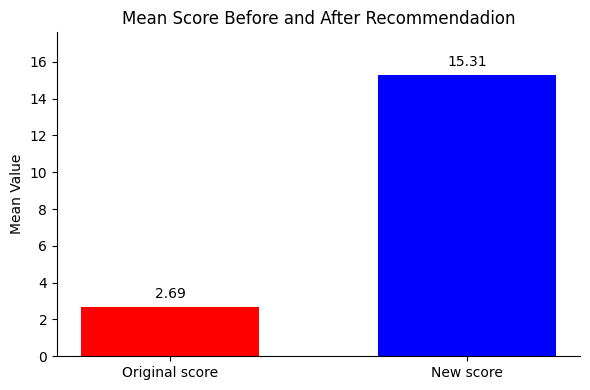

In [0]:
import pandas as pd
import matplotlib.pyplot as plt

means = df_with_answers[['semantic_score', 'new_score']].mean()
means.index = ['Original score', 'New score']

# Plot
fig, ax = plt.subplots(figsize=(6, 4))
bars = ax.bar(means.index, means.values, color=['red', 'blue'], width=0.6)


for bar in bars:
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width() / 2, height + 0.02 * max(means.values),
            f'{height:.2f}', ha='center', va='bottom', fontsize=10)


ax.set_ylabel('Mean Value')
ax.set_title('Mean Score Before and After Recommendadion')
ax.spines[['top', 'right']].set_visible(False)
ax.set_ylim(0, max(means.values) * 1.15)
plt.tight_layout()
plt.show()